# Loading Dataset

In [2]:
import json

with open('E:\\All Aplication\\Interview-Task\\Crescendo-Task\\MLB2016\\MLB2016.json') as f:
    data = json.load(f)

print(data)

{'GameID': ['PIT201604030', 'TBA201604030', 'KCA201604030', 'MIL201604040', 'BAL201604040', 'TEX201604040', 'CIN201604040', 'ATL201604040', 'SDN201604040', 'TBA201604040', 'ARI201604040', 'ANA201604040', 'OAK201604040', 'NYA201604050', 'CLE201604050', 'KCA201604050', 'PIT201604050', 'MIA201604050', 'TBA201604050', 'TEX201604050', 'MIL201604050', 'ARI201604050', 'ANA201604050', 'OAK201604050', 'SDN201604050', 'TBA201604060', 'MIL201604060', 'TEX201604060', 'ARI201604060', 'MIA201604060', 'CLE201604060', 'NYA201604060', 'BAL201604060', 'PIT201604060', 'CIN201604060', 'ATL201604060', 'SDN201604060', 'OAK201604060', 'CIN201604070', 'OAK201604070', 'NYA201604070', 'WAS201604070', 'SFN201604070', 'BAL201604070', 'ARI201604070', 'ANA201604070', 'DET201604080', 'NYN201604080', 'CHA201604080', 'COL201604080', 'TOR201604080', 'BAL201604080', 'CIN201604080', 'ATL201604080', 'MIL201604080', 'KCA201604080', 'ARI201604080', 'ANA201604080', 'SEA201604080', 'SFN201604080', 'TOR201604090', 'DET20160409

In [9]:
print(len(data))

10


# Anser to the Question no - 3

In [109]:
def moneyline_prob_converter(num):
    if num > 0:
        return 100 / (num + 100)
    else:
        return (-1 * (num)) / ((-1 * num) + 100)

def is_win(score1, score2):
    if score1 > score2:
        return 1
    else:
        return 0
firstMoneyUS2_Count = 0
lastMoneyUS2_Count = 0

data_dict = {}
count = 0
for index in range(total):
    gameID = data['GameID'][index]
    #print(gameID)
    #print(data['HomeTeam'][index])
    myDataLines = data['Lines'][index]
    #print(myDataLines)
    for x in myDataLines['MoneyUS2']:
        firstMoneyUS2 = x
        if firstMoneyUS2 != "NA":
            break
    
    for x in reversed(myDataLines['MoneyUS2']):
        lastMoneyUS2 = x
        if lastMoneyUS2 != "NA":
            break
    
    #print(moneyline_prob_converter(firstMoneyUS2))
    #print(moneyline_prob_converter(lastMoneyUS2))
    win_or_lose = is_win(data['FinalScoreHome'][index], data['FinalScoreAway'][index])
    firstMoneyUS2_probability = moneyline_prob_converter(firstMoneyUS2)
    lastMoneyUS2_probability = moneyline_prob_converter(lastMoneyUS2)
    
    data_dict[gameID] = (firstMoneyUS2_probability, lastMoneyUS2_probability, win_or_lose)
    
    if win_or_lose > 0:
        if firstMoneyUS2_probability > lastMoneyUS2_probability:
            firstMoneyUS2_Count = firstMoneyUS2_Count + 1
        else:
            lastMoneyUS2_Count = lastMoneyUS2_Count + 1
    else:
        if firstMoneyUS2_probability < lastMoneyUS2_probability:
            firstMoneyUS2_Count = firstMoneyUS2_Count + 1
        else:
            lastMoneyUS2_Count = lastMoneyUS2_Count + 1
    
    print(gameID, data_dict[gameID])
        
print(firstMoneyUS2_Count)
print(lastMoneyUS2_Count)

PIT201604030 (0.49504950495049505, 0.5412844036697247, 1)
TBA201604030 (0.49019607843137253, 0.5391705069124424, 0)
KCA201604030 (0.4854368932038835, 0.4830917874396135, 1)
MIL201604040 (0.37735849056603776, 0.39215686274509803, 0)
BAL201604040 (0.54337899543379, 0.5327102803738317, 1)
TEX201604040 (0.5305164319248826, 0.5454545454545454, 1)
CIN201604040 (0.5967741935483871, 0.635036496350365, 1)
ATL201604040 (0.37037037037037035, 0.3861003861003861, 0)
SDN201604040 (0.3831417624521073, 0.37037037037037035, 0)
TBA201604040 (0.5098039215686274, 0.5391705069124424, 0)
ARI201604040 (0.6875, 0.6309963099630996, 0)
ANA201604040 (0.4424778761061947, 0.4424778761061947, 0)
OAK201604040 (0.42016806722689076, 0.4366812227074236, 0)
NYA201604050 (0.4608294930875576, 0.47393364928909953, 0)
CLE201604050 (0.5121951219512195, 0.54337899543379, 0)
KCA201604050 (0.4854368932038835, 0.46511627906976744, 0)
PIT201604050 (0.5, 0.5305164319248826, 1)
MIA201604050 (0.49504950495049505, 0.5, 0)
TBA20160405

# Answer to the Question no -3.a

### From the above output information, we can see that "lastMoneyUS2" better predictor for the final outcome. I've counted both predictor value. I found value for the First_MoneyUS2= 1106 and lastMoneyUS2= 1356.  

# Answer to the Question no -1

# Json Data convert to Dataframe

In [587]:
import pandas as pd
data_df = pd.read_json('E:\\All Aplication\\Interview-Task\\Crescendo-Task\\MLB2016\\MLB2016.json')
data_df.head()

,GameID,EventDateTimeUTC,AwayTeam,HomeTeam,DoubleHeaderGame,AwayStartingPitcher,HomeStartingPitcher,FinalScoreAway,FinalScoreHome,Lines
0,PIT201604030,1459703100,St. Louis Cardinals,Pittsburgh Pirates,0,A WAINWRIGHT,F LIRIANO,1,4,"{'EnteredDateTimeUTC': [1459433808.047, 145943..."
1,TBA201604030,1459713900,Toronto Blue Jays,Tampa Bay Rays,0,M STROMAN,C ARCHER,5,3,"{'EnteredDateTimeUTC': [1459433821.007, 145943..."
2,KCA201604030,1459730100,New York Mets,Kansas City Royals,0,M HARVEY,E VOLQUEZ,3,4,"{'EnteredDateTimeUTC': [1459433838.987, 145943..."
3,MIL201604040,1459793400,San Francisco Giants,Milwaukee Brewers,0,MBUMGARNER,W PERALTA,12,3,"{'EnteredDateTimeUTC': [1459618354.15, 1459618..."
4,BAL201604040,1459796700,Minnesota Twins,Baltimore Orioles,0,E SANTANA,C TILLMAN,2,3,"{'EnteredDateTimeUTC': [1459626288.963, 145962..."


In [588]:
data_df.shape

(2462, 10)

In [606]:
data_df.to_csv('Desktop\\data1.csv')

In [387]:
print(list(data_df.columns))

['GameID', 'EventDateTimeUTC', 'AwayTeam', 'HomeTeam', 'DoubleHeaderGame', 'AwayStartingPitcher', 'HomeStartingPitcher', 'FinalScoreAway', 'FinalScoreHome', 'Lines']


In [388]:
data_df.head(20)

,GameID,EventDateTimeUTC,AwayTeam,HomeTeam,DoubleHeaderGame,AwayStartingPitcher,HomeStartingPitcher,FinalScoreAway,FinalScoreHome,Lines
0,PIT201604030,1459703100,St. Louis Cardinals,Pittsburgh Pirates,0,A WAINWRIGHT,F LIRIANO,1,4,"{'EnteredDateTimeUTC': [1459433808.047, 145943..."
1,TBA201604030,1459713900,Toronto Blue Jays,Tampa Bay Rays,0,M STROMAN,C ARCHER,5,3,"{'EnteredDateTimeUTC': [1459433821.007, 145943..."
2,KCA201604030,1459730100,New York Mets,Kansas City Royals,0,M HARVEY,E VOLQUEZ,3,4,"{'EnteredDateTimeUTC': [1459433838.987, 145943..."
3,MIL201604040,1459793400,San Francisco Giants,Milwaukee Brewers,0,MBUMGARNER,W PERALTA,12,3,"{'EnteredDateTimeUTC': [1459618354.15, 1459618..."
4,BAL201604040,1459796700,Minnesota Twins,Baltimore Orioles,0,E SANTANA,C TILLMAN,2,3,"{'EnteredDateTimeUTC': [1459626288.963, 145962..."
5,TEX201604040,1459800300,Seattle Mariners,Texas Rangers,0,F HERNANDEZ,C HAMELS,2,3,"{'EnteredDateTimeUTC': [1459626296.43, 1459626..."
6,CIN201604040,1459800600,Philadelphia Phillies,Cincinnati Reds,0,J HELLICKSON,R IGLESIAS,2,6,"{'EnteredDateTimeUTC': [1459626261.383, 145962..."
7,ATL201604040,1459800600,Washington Nationals,Atlanta Braves,0,M SCHERZER,J TEHERAN,4,3,"{'EnteredDateTimeUTC': [1459626252.617, 145962..."
8,SDN201604040,1459811100,Los Angeles Dodgers,San Diego Padres,0,C KERSHAW,T ROSS,15,0,"{'EnteredDateTimeUTC': [1459626266.243, 145962..."
9,TBA201604040,1459811400,Toronto Blue Jays,Tampa Bay Rays,0,RA DICKEY,D SMYLY,5,3,"{'EnteredDateTimeUTC': [1459626325.92, 1459626..."


In [389]:
# Get all NL Central Team Records for 2016
year = 2018
#data_df.HomeTeam['Chicago Cubs']

data_df.HomeTeam.value_counts()

Chicago Cubs                     89
Cleveland Indians                89
Toronto Blue Jays                86
Los Angeles Dodgers              85
Washington Nationals             84
Texas Rangers                    83
San Francisco Giants             83
New York Mets                    82
Boston Red Sox                   82
Baltimore Orioles                81
Minnesota Twins                  81
Philadelphia Phillies            81
Atlanta Braves                   81
Kansas City Royals               81
Houston Astros                   81
St. Louis Cardinals              81
Tampa Bay Rays                   81
New York Yankees                 81
Milwaukee Brewers                81
Cincinnati Reds                  81
Oakland Athletics                81
Seattle Mariners                 81
Pittsburgh Pirates               81
Arizona Diamondbacks             81
San Diego Padres                 81
Chicago White Sox                81
Colorado Rockies                 81
Detroit Tigers              

In [391]:
cub = pd.concat([cubs1, cubs2],axis=0)
cub

,GameID,EventDateTimeUTC,AwayTeam,HomeTeam,DoubleHeaderGame,AwayStartingPitcher,HomeStartingPitcher,FinalScoreAway,FinalScoreHome,Lines
93,CHN201604110,1460419500,Cincinnati Reds,Chicago Cubs,0,B FINNEGAN,J LESTER,3,5,"{'EnteredDateTimeUTC': [1460287481.28, 1460287..."
118,CHN201604130,1460592300,Cincinnati Reds,Chicago Cubs,0,A SIMON,J LACKEY,2,9,"{'EnteredDateTimeUTC': [1460463073.553, 146046..."
133,CHN201604140,1460678700,Cincinnati Reds,Chicago Cubs,0,R IGLESIAS,J HAMMEL,1,8,"{'EnteredDateTimeUTC': [1460548372.3, 14605483..."
136,CHN201604150,1460744400,Colorado Rockies,Chicago Cubs,0,C BETTIS,K HENDRICKS,6,1,"{'EnteredDateTimeUTC': [1460638986.147, 146063..."
154,CHN201604160,1460830800,Colorado Rockies,Chicago Cubs,0,C BERGMAN,J ARRIETA,2,6,"{'EnteredDateTimeUTC': [1460725239.603, 146072..."
...,...,...,...,...,...,...,...,...,...,...
2453,LAN201610200,1477008300,Chicago Cubs,Los Angeles Dodgers,0,J LESTER,K MAEDA,8,4,"{'EnteredDateTimeUTC': [1476943559.88, 1476943..."
2455,CLE201610250,1477440300,Chicago Cubs,Cleveland Indians,0,J LESTER,C KLUBER,0,6,"{'EnteredDateTimeUTC': [1477320074.77, 1477320..."
2456,CLE201610260,1477523100,Chicago Cubs,Cleveland Indians,0,J ARRIETA,T BAUER,5,1,"{'EnteredDateTimeUTC': [1477428252.82, 1477428..."
2460,CLE201611010,1478045100,Chicago Cubs,Cleveland Indians,0,J ARRIETA,J TOMLIN,9,3,"{'EnteredDateTimeUTC': [1477863415.537, 147786..."


# create a dataframe for season home wins

In [392]:
home_wins = (cubs1[cubs1['FinalScoreHome'] > cubs1['FinalScoreAway']]['HomeTeam'].value_counts())
print(home_wins)
#home_wins.value_counts()
#home_wins.set_axis(['home_wins'],axis='columns',inplace=True)
#home_wins.index.name = 'team'

Chicago Cubs    62
Name: HomeTeam, dtype: int64


# create a dataframe for  season losses

In [393]:
away_wins = (cubs2[cubs2['FinalScoreHome'] > cubs2['FinalScoreAway']]['AwayTeam'].value_counts()) 
print(home_losses)
#home_losses.set_axis(['losses'],axis='columns',inplace=True)
#home_losses.index.name = 'away_team'

Chicago Cubs    52
Name: AwayTeam, dtype: int64


# Chicago Cubs Win Percentage

In [394]:
home_play = (cubs1['HomeTeam'].value_counts())
#home_play
away_play = (cubs2['AwayTeam'].value_counts())
away_play

Chicago Cubs    90
Name: AwayTeam, dtype: int64

# Final Win Percentage of the Chicago Cubs at the end of 2016

In [395]:
Chicago_Cubs_win_percentage = (home_wins + away_wins)/(home_play + away_play)*100
Chicago_Cubs_win_percentage = Chicago_Cubs_win_percentage.round(2)
print(Chicago_Cubs_win_percentage)

Chicago Cubs    55.31
dtype: float64


# Answer to the Question no - 1.a
## Plot the winning percentage of the Chicago Cubs as a function of time in 2016.

In [396]:
import matplotlib.pyplot as plt
import seaborn as sns

('November', 100.0)
('August', 78.57142857142857)
('April', 77.27272727272727)
('May', 66.66666666666666)
('September', 62.06896551724138)
('October', 58.82352941176471)
('June', 55.172413793103445)
('July', 44.0)


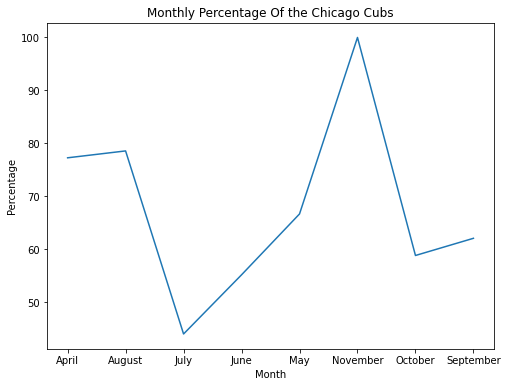

In [603]:
from datetime import datetime

    
import operator
data_dict = {}   #{player: (num_games, num_wins)}

def is_win(score1, score2):
        if score1 > score2:
            return True
        else:
            return False

for index, row in cub.iterrows():
    eventDate = datetime.utcfromtimestamp(row['EventDateTimeUTC']).strftime('%Y-%m-%d')
    eventDateMonth = datetime.strptime(eventDate, '%Y-%m-%d')
    eventMonth = eventDateMonth.strftime('%B')
    #print(eventMonth, row['AwayTeam'], row['HomeTeam'], row['FinalScoreAway'], row['FinalScoreHome'])
    
    if eventMonth not in data_dict:
        if row['AwayTeam'] == 'Chicago Cubs':
            if (is_win(row['FinalScoreAway'], row['FinalScoreHome'])):
                data_dict[eventMonth] = (1, 1)
            else:
                data_dict[eventMonth] = (1, 0)
        else:
            if (is_win(row['FinalScoreHome'], row['FinalScoreAway'])):
                data_dict[eventMonth] = (1, 1)
            else:
                data_dict[eventMonth] = (1, 0)
            #print(data_dict)
    else:
        num_games, num_wins = data_dict[eventMonth]
        if row['AwayTeam'] == 'Chicago Cubs':
            if (is_win(row['FinalScoreAway'], row['FinalScoreHome'])):
                data_dict[eventMonth] = (num_games+1, num_wins+1)
            else:
                data_dict[eventMonth] = (num_games+1, num_wins)
        else:
            if (is_win(row['FinalScoreHome'], row['FinalScoreAway'])):
                data_dict[eventMonth] = (num_games+1, num_wins+1)
            else:
                data_dict[eventMonth] = (num_games+1, num_wins)
                
#print(data_dict)


data_dict_rank = {} 
for data in data_dict:
    num_games, num_wins = data_dict[data]
    data_dict_rank[data] = ((num_wins/num_games)*100) 
#print(data_dict_rank)
listofTuples = sorted(data_dict_rank.items() , reverse=True, key=lambda x: x[1])
for elem in listofTuples :
    #print(elem[0] , " ::" , elem[1] ) 
    print(elem)
    
#{'April': 89.55, 'May': 67, 'June': (29, 16), 'July': (25, 11), 'August': (28, 22), 'September': (29, 18), 'October': (17, 10), 'November': (2, 2)}

import matplotlib.pylab as plt

lists = sorted(data_dict_rank.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.title('Monthly Percentage Of the Chicago Cubs')
plt.xlabel('Month')
plt.ylabel('Percentage')
plt.plot(x, y)
plt.show()

# Answer to the Question no- 2
## Create an object that counts the number of games each pitcher started and the number of wins

In [460]:
data_df.head(50)

,GameID,EventDateTimeUTC,AwayTeam,HomeTeam,DoubleHeaderGame,AwayStartingPitcher,HomeStartingPitcher,FinalScoreAway,FinalScoreHome,Lines
0,PIT201604030,1459703100,St. Louis Cardinals,Pittsburgh Pirates,0,A WAINWRIGHT,F LIRIANO,1,4,"{'EnteredDateTimeUTC': [1459433808.047, 145943..."
1,TBA201604030,1459713900,Toronto Blue Jays,Tampa Bay Rays,0,M STROMAN,C ARCHER,5,3,"{'EnteredDateTimeUTC': [1459433821.007, 145943..."
2,KCA201604030,1459730100,New York Mets,Kansas City Royals,0,M HARVEY,E VOLQUEZ,3,4,"{'EnteredDateTimeUTC': [1459433838.987, 145943..."
3,MIL201604040,1459793400,San Francisco Giants,Milwaukee Brewers,0,MBUMGARNER,W PERALTA,12,3,"{'EnteredDateTimeUTC': [1459618354.15, 1459618..."
4,BAL201604040,1459796700,Minnesota Twins,Baltimore Orioles,0,E SANTANA,C TILLMAN,2,3,"{'EnteredDateTimeUTC': [1459626288.963, 145962..."
5,TEX201604040,1459800300,Seattle Mariners,Texas Rangers,0,F HERNANDEZ,C HAMELS,2,3,"{'EnteredDateTimeUTC': [1459626296.43, 1459626..."
6,CIN201604040,1459800600,Philadelphia Phillies,Cincinnati Reds,0,J HELLICKSON,R IGLESIAS,2,6,"{'EnteredDateTimeUTC': [1459626261.383, 145962..."
7,ATL201604040,1459800600,Washington Nationals,Atlanta Braves,0,M SCHERZER,J TEHERAN,4,3,"{'EnteredDateTimeUTC': [1459626252.617, 145962..."
8,SDN201604040,1459811100,Los Angeles Dodgers,San Diego Padres,0,C KERSHAW,T ROSS,15,0,"{'EnteredDateTimeUTC': [1459626266.243, 145962..."
9,TBA201604040,1459811400,Toronto Blue Jays,Tampa Bay Rays,0,RA DICKEY,D SMYLY,5,3,"{'EnteredDateTimeUTC': [1459626325.92, 1459626..."


# Number of Games each Pitcher Started and the number of Wins

In [477]:
import operator
data_dict = {}   #{player: (num_games, num_wins)}

def is_win(score1, score2):
    if score1 > score2:
        return True
    else:
        return False
    

for index, row in data_df.iterrows():
    if row[5] not in data_dict:
        if (is_win(row[7], row[8])):
            data_dict[row[5]] = (1, 1)
        else:
            data_dict[row[5]] = (1, 0)
    else:
        num_games, num_wins = data_dict[row[5]]
        if (is_win(row[7], row[8])):
            num_wins = num_wins + 1        
        data_dict[row[5]] = (num_games+1, num_wins)
            
    if row[6] not in data_dict:
        if (is_win(row[8], row[7])):
            data_dict[row[6]] = (1, 1)
        else:
            data_dict[row[6]] = (1, 0)
    else:
        num_games, num_wins = data_dict[row[6]]
        if (is_win(row[8], row[7])):
            num_wins = num_wins + 1        
        data_dict[row[6]] = (num_games+1, num_wins)
#print(data_dict)
print("Pitcher :"           "Games:"              "Wins:")
for key, value in data_dict.items():
    print(key, ' : ', value)

Pitcher :Games:Wins:
A WAINWRIGHT  :  (33, 22)
F LIRIANO  :  (29, 13)
M STROMAN  :  (32, 14)
C ARCHER  :  (33, 10)
M HARVEY  :  (17, 6)
E VOLQUEZ  :  (34, 17)
MBUMGARNER  :  (1, 1)
W PERALTA  :  (23, 9)
E SANTANA  :  (30, 8)
C TILLMAN  :  (32, 22)
F HERNANDEZ  :  (25, 15)
C HAMELS  :  (33, 24)
J HELLICKSON  :  (32, 17)
R IGLESIAS  :  (5, 3)
M SCHERZER  :  (36, 24)
J TEHERAN  :  (30, 10)
C KERSHAW  :  (25, 20)
T ROSS  :  (1, 0)
RA DICKEY  :  (4, 3)
D SMYLY  :  (30, 13)
J DE LA ROSA  :  (24, 11)
Z GREINKE  :  (26, 16)
J ARRIETA  :  (34, 21)
G RICHARDS  :  (6, 2)
C SALE  :  (32, 18)
R HILL  :  (21, 12)
D KEUCHEL  :  (26, 12)
MTANAKA  :  (1, 0)
D PRICE  :  (36, 20)
C KLUBER  :  (38, 24)
N SYNDERGAARD  :  (30, 18)
C YOUNG  :  (13, 5)
M WACHA  :  (24, 14)
J NIESE  :  (19, 9)
J VERLANDER  :  (33, 20)
W CHEN  :  (22, 13)
A SANCHEZ  :  (58, 28)
J ODORIZZI  :  (33, 17)
H IWAKUMA  :  (31, 17)
M PEREZ  :  (33, 18)
J CUETO  :  (32, 22)
J NELSON  :  (32, 12)
C BETTIS  :  (32, 21)
S MILLER  :  (19, 6

# Answer to the Question no- 2.a
## Rank the Pitchers from Best to Worst using the Information Form the Table Above

In [500]:
data_dict_rank = {} 
for data in data_dict:
    num_games, num_wins = data_dict[data]
    data_dict_rank[data] = ((num_wins/num_games)*100, num_games, num_wins) 

listofTuples = sorted(data_dict_rank.items() , reverse=True, key=lambda x: x[1])
for elem in listofTuples :
    print(elem[0] , " ::" , elem[1] ) 

S LUGO  :: (100.0, 7, 7)
S O'SULLIVAN  :: (100.0, 4, 4)
J COLLMENTER  :: (100.0, 3, 3)
RHILL  :: (100.0, 2, 2)
JNICASIO  :: (100.0, 2, 2)
B IWAKUMA  :: (100.0, 2, 2)
C MARTIN  :: (100.0, 2, 2)
R MERRITT  :: (100.0, 2, 2)
MBUMGARNER  :: (100.0, 1, 1)
JLESTER  :: (100.0, 1, 1)
JQUINTANA  :: (100.0, 1, 1)
SGRAY  :: (100.0, 1, 1)
E RAMIREZ  :: (100.0, 1, 1)
RSTEPHENSON  :: (100.0, 1, 1)
WPEREZ  :: (100.0, 1, 1)
D HUTCHISN  :: (100.0, 1, 1)
JARRIETA  :: (100.0, 1, 1)
TCHATWOOD  :: (100.0, 1, 1)
K FLORES  :: (100.0, 1, 1)
JNIESE  :: (100.0, 1, 1)
DDUFFY  :: (100.0, 1, 1)
N SYNDERGARD  :: (100.0, 1, 1)
AL BATTING LAST  :: (100.0, 1, 1)
SWRIGHT  :: (100.0, 1, 1)
JCUETO  :: (100.0, 1, 1)
K SAMPSON  :: (100.0, 1, 1)
M ALBERS  :: (100.0, 1, 1)
B MATUSZ  :: (100.0, 1, 1)
DFISTER  :: (100.0, 1, 1)
T CAHILL  :: (100.0, 1, 1)
TANDERSON  :: (100.0, 1, 1)
BSNELL  :: (100.0, 1, 1)
ZNEAL  :: (100.0, 1, 1)
KSAMPSON  :: (100.0, 1, 1)
T WILLIAMS  :: (100.0, 1, 1)
CRICHARD  :: (100.0, 1, 1)
J BUCHANAN  :: (1

## I ranked the pitchers from best to worst based on number of Games each Pitcher and the number of Wins. 
##  I've based on Pitcher, Games and Wins. If we see the above output of the Pitcher "S LUGO", it's 100 ranked. 
##  Beacuse, it plays 7 games and it wins 7 games. 
